In [1]:
import tensorflow as tf 
import keras
import keras_cv
import keras_core
from keras import losses , metrics 
import numpy as np 
import matplotlib.pyplot as plt 

Using TensorFlow backend


In [2]:
train_ds , val_ds = tf.keras.utils.image_dataset_from_directory (
    "dataset",
    labels="inferred",
    color_mode="rgb",
    batch_size=32,
    image_size = (256,256),
    shuffle=True,
    seed =123,
    validation_split=0.2,
    subset = "both",
    verbose=True
)

Found 4756 files belonging to 2 classes.
Using 3805 files for training.
Using 951 files for validation.


2024-06-21 03:44:48.754564: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-06-21 03:44:48.809148: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-06-21 03:44:48.812103: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

In [3]:
train_ds 

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>

In [4]:
class_names = train_ds.class_names
print(class_names)

['Defective', 'nondefective']


2024-06-21 01:55:33.638733: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


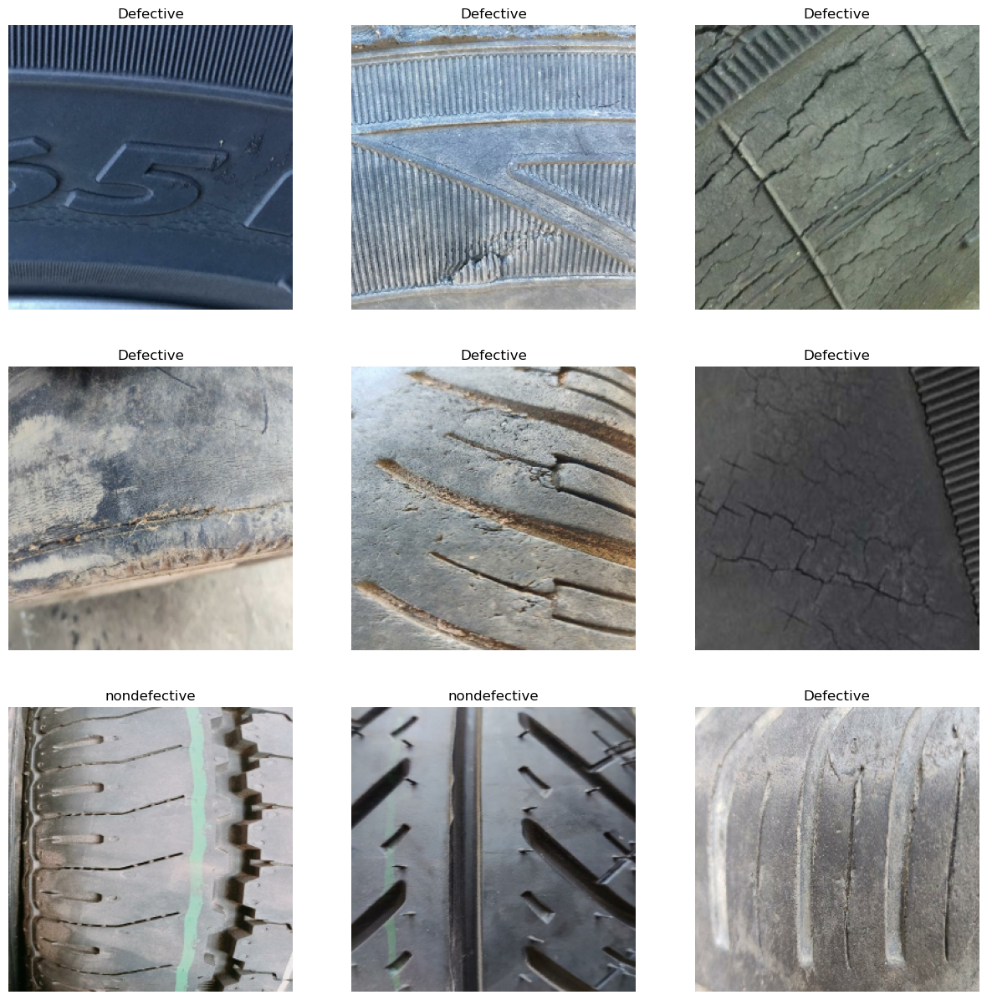

In [5]:
plt.figure(figsize=(15, 15))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [6]:
image = next(iter(train_ds.take(1)))[0]
image.shape

TensorShape([32, 256, 256, 3])

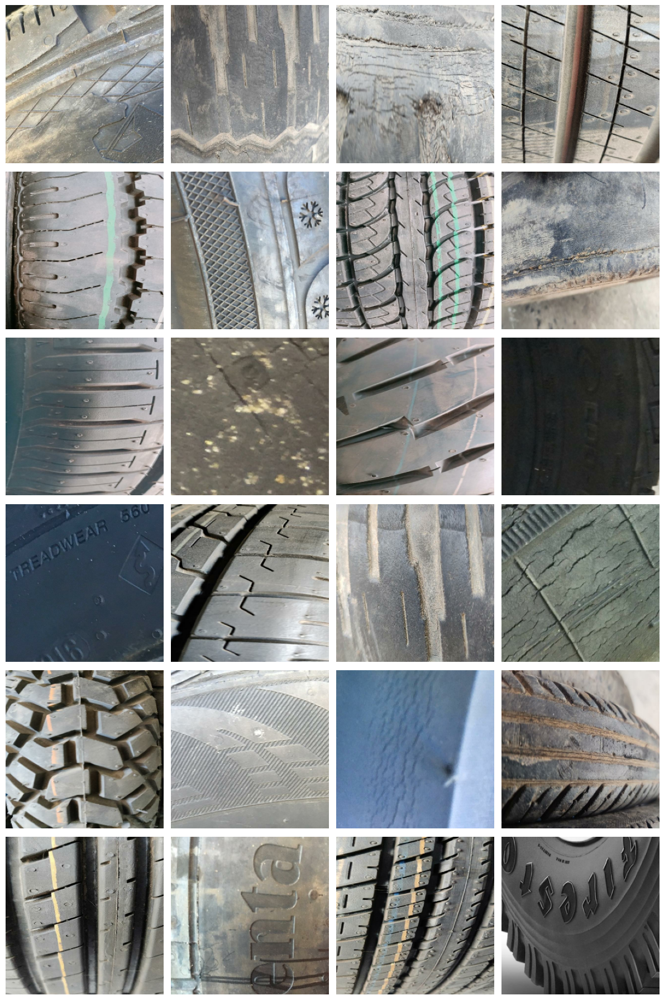

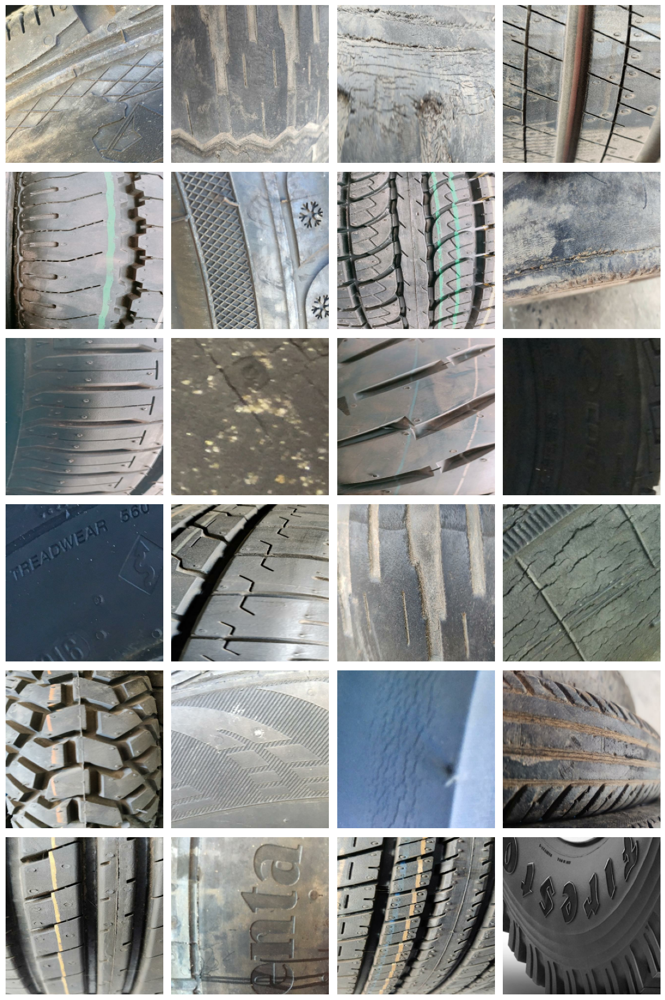

In [7]:
keras_cv.visualization.plot_image_gallery(image , value_range=(0,255), scale=3, rows=6, cols=4)

In [8]:
model = keras_cv.models.ImageClassifier.from_preset(

    "efficientnetv2_b0_imagenet",
    num_classes = 2
)

In [9]:
model.compile(

    loss = "sparse_categorical_crossentropy",
    optimizer = tf.keras.optimizers.AdamW(),
    metrics = ["accuracy"]
)

In [10]:
model_history = model.fit(

    train_ds,
    validation_data = val_ds,
    epochs = 5,   
)

Epoch 1/5


I0000 00:00:1718902593.052457   94227 service.cc:145] XLA service 0x7c1c000028e0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1718902593.052542   94227 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce GTX 1650, Compute Capability 7.5
2024-06-21 01:56:35.102412: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-06-21 01:56:40.421928: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
I0000 00:00:1718902672.765840   94227 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_18', 24 bytes spill stores, 24 bytes spill loads

I0000 00:00:1718902672.876433   94227 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


118/119 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step - accuracy: 0.8745 - loss: 0.2746

2024-06-21 01:59:03.159465: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng4{k11=1} for conv (f32[29,32,128,128]{3,2,1,0}, u8[0]{0}) custom-call(f32[29,16,128,128]{3,2,1,0}, f32[16,32,3,3]{3,2,1,0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBackwardInput", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0}} is taking a while...
2024-06-21 01:59:05.148163: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 2.988766187s
Trying algorithm eng4{k11=1} for conv (f32[29,32,128,128]{3,2,1,0}, u8[0]{0}) custom-call(f32[29,16,128,128]{3,2,1,0}, f32[16,32,3,3]{3,2,1,0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBackwardInput", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"c

119/119 ━━━━━━━━━━━━━━━━━━━━ 264s 1s/step - accuracy: 0.8754 - loss: 0.2730 - val_accuracy: 0.9611 - val_loss: 0.0942
Epoch 2/5
119/119 ━━━━━━━━━━━━━━━━━━━━ 29s 247ms/step - accuracy: 0.9673 - loss: 0.0853 - val_accuracy: 0.9989 - val_loss: 0.0089
Epoch 3/5
119/119 ━━━━━━━━━━━━━━━━━━━━ 30s 251ms/step - accuracy: 0.9844 - loss: 0.0437 - val_accuracy: 0.9968 - val_loss: 0.0118
Epoch 4/5
119/119 ━━━━━━━━━━━━━━━━━━━━ 30s 251ms/step - accuracy: 0.9924 - loss: 0.0240 - val_accuracy: 0.9958 - val_loss: 0.0082
Epoch 5/5
119/119 ━━━━━━━━━━━━━━━━━━━━ 30s 251ms/step - accuracy: 0.9929 - loss: 0.0268 - val_accuracy: 0.9968 - val_loss: 0.0094


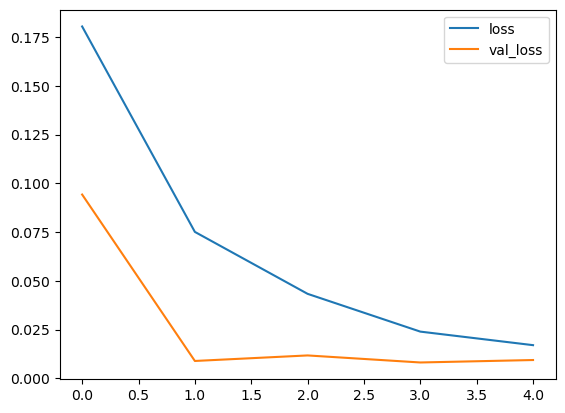

In [14]:
plt.plot(model_history.history["loss"],label="loss")
plt.plot(model_history.history["val_loss"],label="val_loss")
plt.legend()

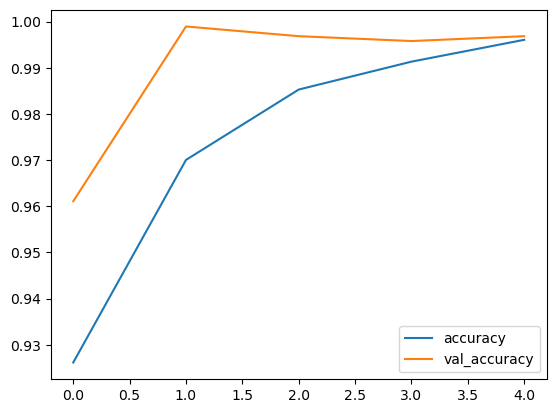

In [15]:
plt.plot(model_history.history["accuracy"],label="accuracy")
plt.plot(model_history.history["val_accuracy"],label="val_accuracy")
plt.legend()

In [16]:
model.save("model_accuracy_0.9929_loss_0.0268_val_accuracy_0.9968_val_loss_0.0094.h5")

In [17]:
model.save('my_model.keras')

In [18]:
model.summary(show_trainable = True)

Model: "image_classifier"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ input_layer (InputLayer)    │ (None, None, None, 3) │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ efficient_net_v2b0_backbone │ (None, None, None,    │  5,919,312 │   Y   │
│ (EfficientNetV2Backbone)    │ 1280)                 │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ avg_pool                    │ (None, 1280)          │          0 │   -   │
│ (GlobalAveragePooling2D)    │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ predictions (Dense)         │ (None, 2)             │      2,562 │   Y   │
└─────────────────────────────┴───────────────────────┴────────────┴───────┘

 Total params: 17,644,408 (67.31 MB)

 Trainable params: 5,861,266 (22.36 MB)

 Non-trainable params: 60,608 (236.75 KB)

 Optimizer params: 11,722,534 (44.72 MB)

In [7]:
from keras.models import load_model
loaded_model = load_model('my_model.keras')


In [9]:
loaded_model.summary(show_trainable = True)

Model: "image_classifier"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ input_layer_1 (InputLayer)  │ (None, None, None, 3) │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ efficient_net_v2b0_backbone │ (None, None, None,    │  5,919,312 │   Y   │
│ (EfficientNetV2Backbone)    │ 1280)                 │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ avg_pool                    │ (None, 1280)          │          0 │   -   │
│ (GlobalAveragePooling2D)    │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ predictions (Dense)         │ (None, 2)             │      2,562 │   Y   │
└─────────────────────────────┴───────────────────────┴────────────┴───────┘

 Total params: 11,783,142 (44.95 MB)

 Trainable params: 5,861,266 (22.36 MB)

 Non-trainable params: 60,608 (236.75 KB)

 Optimizer params: 5,861,268 (22.36 MB)

In [36]:
val_labels = np.array([])

In [41]:

# Initialize an empty list to store labels
all_labels = []

# Iterate over the validation dataset
for _, labels in val_ds:
    all_labels.extend(labels.numpy())  # Convert labels to a NumPy array and extend the list

# Convert the list of labels to a NumPy array
all_labels_array = np.array(all_labels)

# Now 'all_labels_array' contains all the labels from the validation dataset
print(all_labels_array), print(len(all_labels_array))


2024-06-21 04:07:26.250577: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


[0 0 0 1 1 1 1 0 1 1 1 0 0 0 0 0 0 0 1 1 1 1 1 1 0 1 0 1 0 1 0 0 1 1 0 0 0
 1 1 0 1 1 1 0 1 0 0 0 1 0 1 1 0 0 1 1 0 0 0 1 1 0 0 0 0 1 0 1 1 0 0 0 0 1
 0 0 1 1 1 0 0 0 0 0 1 1 1 1 1 1 1 0 0 0 0 1 0 0 1 0 0 1 1 1 1 1 1 0 1 0 1
 0 1 1 0 0 0 1 1 1 0 0 1 0 0 0 0 1 0 0 0 1 0 0 1 0 0 1 1 1 1 0 1 0 1 0 1 0
 0 1 0 0 1 0 0 0 1 1 1 0 0 1 0 0 1 0 0 1 0 1 1 1 0 0 1 1 0 0 1 0 0 1 0 1 0
 1 1 1 1 1 1 0 0 1 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 1 0 1 0
 0 1 1 0 0 0 1 1 1 0 0 1 0 0 0 1 0 0 1 1 0 1 0 1 0 1 0 0 1 0 0 1 1 0 1 1 1
 1 1 1 0 1 0 0 1 0 1 0 0 1 1 0 1 0 0 0 0 1 1 0 0 0 0 0 1 1 0 0 0 1 0 1 0 1
 1 0 1 0 1 1 1 1 1 0 0 1 1 0 0 0 1 0 0 0 1 0 0 1 0 1 1 0 0 0 0 1 1 1 1 1 1
 0 0 0 1 1 0 0 0 0 1 1 0 1 0 0 0 0 0 0 1 1 0 1 0 0 1 0 1 1 0 0 0 0 0 0 1 1
 1 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 1 0 0 1 1 1 0 1 1 1 0 1 1 0 1 1 1 0 0 0 0
 0 1 0 1 0 1 0 0 1 0 1 0 1 1 1 1 1 0 0 1 1 0 0 1 0 0 0 0 1 1 0 0 1 1 1 0 1
 0 0 1 1 1 0 0 0 1 1 0 0 0 0 0 0 1 1 0 1 0 0 0 0 1 1 1 1 1 0 0 1 0 0 1 0 1
 0 1 0 0 1 1 1 0 1 0 0 0 

(None, None)

In [19]:
from sklearn.metrics import confusion_matrix , classification_report
import seaborn as sns

In [15]:
predict = loaded_model.predict(val_ds)

I0000 00:00:1718909722.212764  142066 service.cc:145] XLA service 0x71f3b0002c40 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1718909722.212802  142066 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce GTX 1650, Compute Capability 7.5
2024-06-21 03:55:22.370864: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-06-21 03:55:23.091962: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907


 4/30 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step

I0000 00:00:1718909729.829120  142066 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


30/30 ━━━━━━━━━━━━━━━━━━━━ 23s 436ms/step


In [23]:
predict.shape,len(predict)/32

((951, 2), 29.71875)

In [40]:
print(np.argmax(predict , axis = 1))

[0 0 0 1 1 1 1 0 1 1 1 0 0 0 0 0 0 0 1 1 1 1 1 1 0 1 0 1 0 1 0 0 1 1 0 0 0
 1 1 0 1 1 1 0 1 0 0 0 1 0 1 1 0 0 1 1 0 0 0 1 1 0 0 0 0 1 0 1 1 0 0 0 0 1
 0 0 1 1 1 0 0 0 0 0 1 1 1 1 1 1 1 0 0 0 0 1 0 0 1 0 0 1 1 1 1 1 1 0 1 0 1
 0 1 1 0 0 0 1 1 1 0 0 1 0 0 0 0 1 0 0 0 1 0 0 1 0 0 1 1 1 1 0 1 0 1 0 1 0
 0 1 0 0 1 0 0 0 1 1 1 0 0 1 0 0 1 0 0 1 0 1 1 1 0 0 1 1 0 0 1 0 0 1 1 1 0
 1 1 1 1 1 1 0 0 1 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 1 0 1 0
 0 1 1 0 0 0 1 1 1 0 0 1 0 0 0 1 0 0 1 1 0 1 0 1 0 1 0 0 1 0 0 1 1 0 1 1 1
 1 1 1 0 1 0 0 1 0 1 0 0 1 1 0 1 0 0 0 0 1 1 0 0 0 0 0 1 1 0 0 0 1 0 1 0 1
 1 0 1 0 1 0 1 1 1 0 0 1 1 0 0 0 1 0 0 0 1 0 0 1 0 1 1 0 0 0 0 1 1 1 1 1 1
 0 0 0 1 1 0 0 0 0 1 1 0 1 0 0 0 0 0 0 1 1 0 1 0 0 1 0 1 1 0 0 0 0 0 0 1 1
 1 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 1 0 0 1 1 1 0 1 1 1 0 1 1 0 1 1 0 0 0 0 0
 0 1 0 1 0 1 0 0 1 0 1 0 1 1 1 1 1 0 0 1 1 0 0 1 0 0 0 0 1 1 0 0 1 1 1 0 1
 0 0 1 1 1 0 0 0 1 1 0 0 0 0 0 0 1 1 0 1 0 0 0 0 1 1 1 1 1 0 0 1 0 0 1 0 1
 0 1 0 0 1 1 1 0 1 0 0 0 

In [31]:
val_ds.class_names

['Defective', 'nondefective']

In [43]:
max_predic = np.argmax(predict , axis = 1)

In [44]:
max_predic

array([0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1,
       1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0,
       1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1,
       0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1,
       1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0,
       1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0,
       0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1,
       0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0,
       1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1,
       0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1,
       0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0,
       1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1,

In [51]:
from sklearn.metrics import confusion_matrix , classification_report
cm = confusion_matrix(all_labels_array, max_predic)


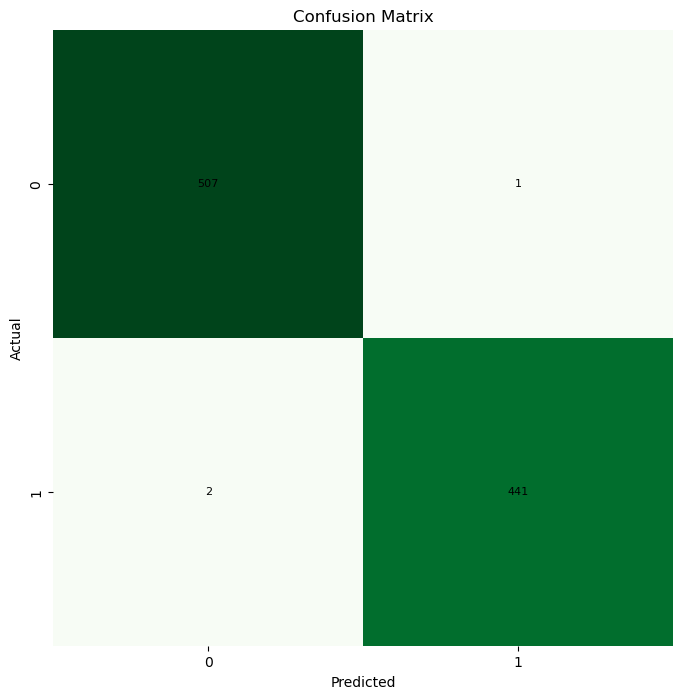

In [48]:
# Plot confusion matrix with annotations for all values
plt.figure(figsize=(8, 8))
ax = sns.heatmap(cm, annot=False, fmt='d', cmap='Greens', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')

# Add annotations for correct classifications
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        ax.text(j + 0.5, i + 0.5, f'{cm[i, j]}', ha='center', va='center', color='black', fontsize=8)

plt.show()

In [49]:
# Calculate and print accuracy for each class
class_accuracies = cm.diagonal() / cm.sum(axis=1)
for i, accuracy in enumerate(class_accuracies):
    print(f'Accuracy for class {i}: {accuracy:.2f}')

Accuracy for class 0: 1.00
Accuracy for class 1: 1.00


In [52]:
# Print classification report
print("Classification Report:")
print(classification_report(all_labels_array, max_predic))


Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       508
           1       1.00      1.00      1.00       443

    accuracy                           1.00       951
   macro avg       1.00      1.00      1.00       951
weighted avg       1.00      1.00      1.00       951

